# [Lighthouse] Desafio Cientista de Dados - Manutenção preventiva

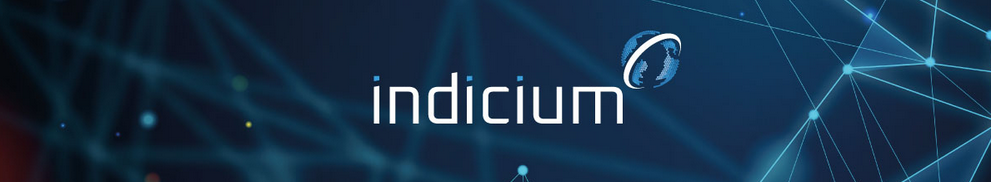


*O objetivo é identificar quais máquinas apresentam potencial de falha tendo como base dados extraídos através de sensores durante o processo de manufatura.  Há dois datasets: um dataset chamado desafio_manutencao_preditiva_treino composto por 6667 observações com a variável a ser prevista (“failure_type”) e um segundo dataset chamado de desafio_manutencao_preditiva_teste que possui 3333 observações para serem preditas.*

Identificação: Alisson de Souza Louly


## Importando Bibliotecas

In [635]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sidetable as stb

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTENC

from lazypredict.Supervised import LazyClassifier
from xgboost import XGBClassifier
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,plot_confusion_matrix

from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, fbeta_score
from sklearn.metrics import confusion_matrix, make_scorer
from sklearn.inspection import permutation_importance
from sklearn.model_selection import GridSearchCV
import time

import warnings
warnings.filterwarnings("ignore")

In [540]:
#Lendo a base de dados
df = pd.read_csv('desafio_manutencao_preditiva_treino.csv')

In [541]:
#Visualizando as 5 primeiras linhas da base
df.head()

,udi,product_id,type,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min,failure_type
0,1,M14860,M,298.10,308.60,1551,42.80,0,No Failure
1,2,L47181,L,298.20,308.70,1408,46.30,3,No Failure
2,5,L47184,L,298.20,308.70,1408,40.00,9,No Failure
3,6,M14865,M,298.10,308.60,1425,41.90,11,No Failure
4,7,L47186,L,298.10,308.60,1558,42.40,14,No Failure


## Análise exploratória dos Dados

### Dimensões e tipos de variáveis

In [542]:
df.shape

(6667, 9)

In [543]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6667 entries, 0 to 6666
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   udi                    6667 non-null   int64  
 1   product_id             6667 non-null   object 
 2   type                   6667 non-null   object 
 3   air_temperature_k      6667 non-null   float64
 4   process_temperature_k  6667 non-null   float64
 5   rotational_speed_rpm   6667 non-null   int64  
 6   torque_nm              6667 non-null   float64
 7   tool_wear_min          6667 non-null   int64  
 8   failure_type           6667 non-null   object 
dtypes: float64(3), int64(3), object(3)
memory usage: 468.9+ KB


In [544]:
df['udi'] = df['udi'].astype('str')
df['rotational_speed_rpm'] = df['rotational_speed_rpm'].astype('float')
df['tool_wear_min'] = df['tool_wear_min'].astype('float')

Ajustando a varíavel udi para o tipo string por ser um identificador e tool_wear_min e rotational_speed_rpm para o tipo float o mesmo tipo das outras variaveis quantitativas.

### Valores faltantes

In [545]:
df.stb.missing()

,missing,total,percent
udi,0,6667,0.00
product_id,0,6667,0.00
type,0,6667,0.00
air_temperature_k,0,6667,0.00
process_temperature_k,0,6667,0.00
rotational_speed_rpm,0,6667,0.00
torque_nm,0,6667,0.00
tool_wear_min,0,6667,0.00
failure_type,0,6667,0.00


Não há valores faltantes na base

### Linhas duplicadas

In [546]:
df.duplicated().sum()

0

Não há linhas duplicadas na base

### Análise Descritiva

In [547]:
df.stb.counts()

,count,unique,most_freq,most_freq_count,least_freq,least_freq_count
type,6667,3,L,4022,H,658
failure_type,6667,6,No Failure,6435,Random Failures,12
process_temperature_k,6667,82,310.60,205,305.70,1
air_temperature_k,6667,93,300.70,176,304.50,1
tool_wear_min,6667,243,0.00,82,239.00,1
torque_nm,6667,547,40.60,38,13.70,1
rotational_speed_rpm,6667,840,1452.00,33,2116.00,1
udi,6667,6667,1,1,1,1
product_id,6667,6667,M14860,1,M14860,1


In [548]:
df.describe()

,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min
count,6667.00,6667.00,6667.00,6667.00,6667.00
mean,299.99,309.99,1537.42,40.06,108.10
std,1.99,1.49,177.18,9.95,63.36
min,295.30,305.70,1168.00,3.80,0.00
25%,298.30,308.80,1422.50,33.20,54.00
50%,300.00,310.00,1503.00,40.20,108.00
75%,301.50,311.10,1612.00,46.80,162.00
max,304.50,313.80,2886.00,76.60,251.00


Checkando um "resumo das estatísticas descritivas" como a média e máximos/mínimos das variáveis com atenção especial para a
existência de outliers se o máximo for muito maior terceiro quartil. A váriavies relacionadas a potência (torque e rotational_speed) tem o máximo muito distântes dos 75% dos dados.

In [549]:
num_features = [col for col in df.columns if df[col].dtype=='float64']

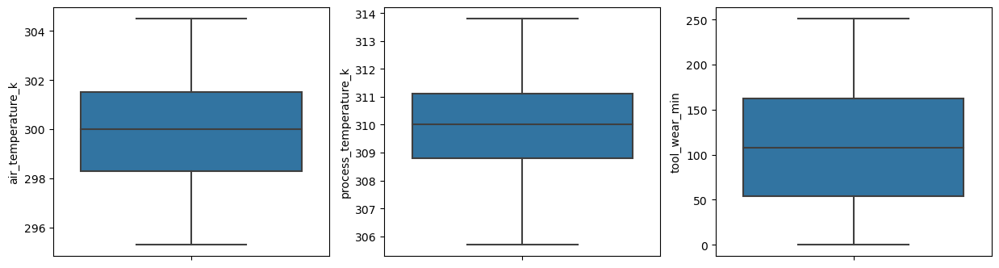

In [550]:
fig, ax = plt.subplots(1,3 ,figsize=(15,4))
#fig.suptitle('Numeric features boxplot')
sns.boxplot(data=df, y='air_temperature_k',ax=ax[0])
sns.boxplot( data=df, y='process_temperature_k',ax=ax[1])
sns.boxplot( data=df, y='tool_wear_min',ax=ax[2])

plt.show()

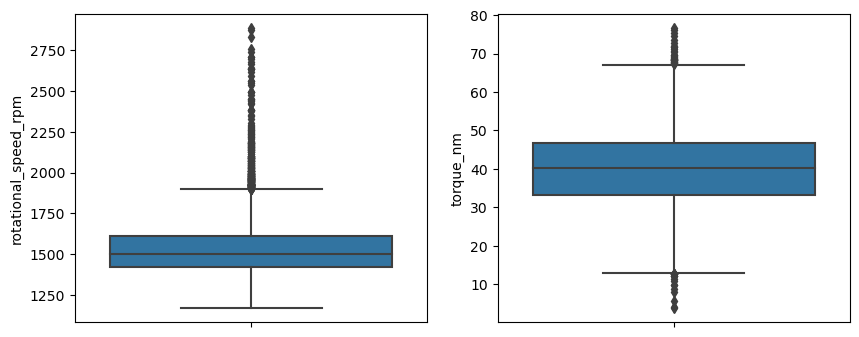

In [551]:
fig, ax = plt.subplots(1,2,figsize=(10,4))
#fig.suptitle('Numeric features boxplot')
sns.boxplot(data=df, y='rotational_speed_rpm',ax=ax[0])
sns.boxplot( data=df, y='torque_nm',ax=ax[1])
plt.show()

O Boxplot é um ótima forma de visualizar a distribuição dos dados e como já observado nas "estatísicas" descritivas, as variaveis torque e rotational_speed realmente 
possuem outliers

### Análise univariável

#### Air temperature

In [552]:
df['air_temperature_k'].describe()

count   6667.00
mean     299.99
std        1.99
min      295.30
25%      298.30
50%      300.00
75%      301.50
max      304.50
Name: air_temperature_k, dtype: float64

Descrição estatística da variável air_temperature

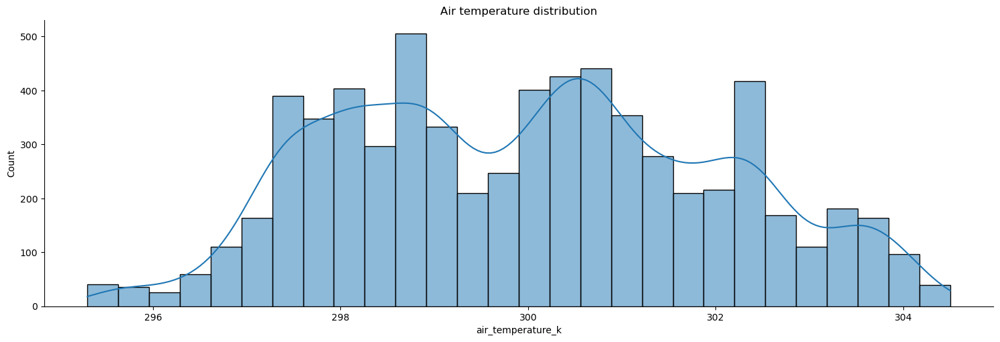

In [553]:
sns.displot(data=df, x='air_temperature_k',height = 5, aspect = 3, kde= True)
plt.title('Air temperature distribution')
plt.show()

O distplot representa a variação na distribuição dos dados, a variável air_temperature não possui uma viariação absoluta expressiva e como está relacionada a fatores climáticos tende a ter um comportamento não tão previsível.

#### Process temperature

In [554]:
df['process_temperature_k'].describe()

count   6667.00
mean     309.99
std        1.49
min      305.70
25%      308.80
50%      310.00
75%      311.10
max      313.80
Name: process_temperature_k, dtype: float64

Descrição estatística da variável process_temperature

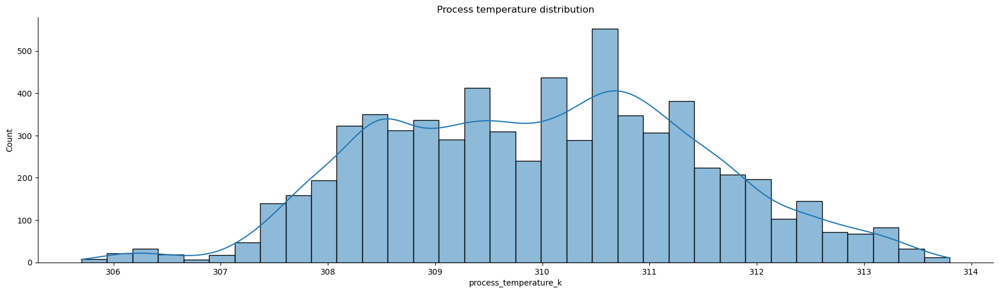

In [555]:
sns.displot(data=df, x='process_temperature_k',height = 5, aspect = 3.5, kde= True)
plt.title('Process temperature distribution')
plt.show()

Assim como a air_temperature, a variável process_temperature não há grande variação absoluta e tende a ter uma distribuição normal.

#### Tool wear minutes

In [556]:
df['tool_wear_min'].describe()

count   6667.00
mean     108.10
std       63.36
min        0.00
25%       54.00
50%      108.00
75%      162.00
max      251.00
Name: tool_wear_min, dtype: float64

Descrição estatística da variável tool_wear_min

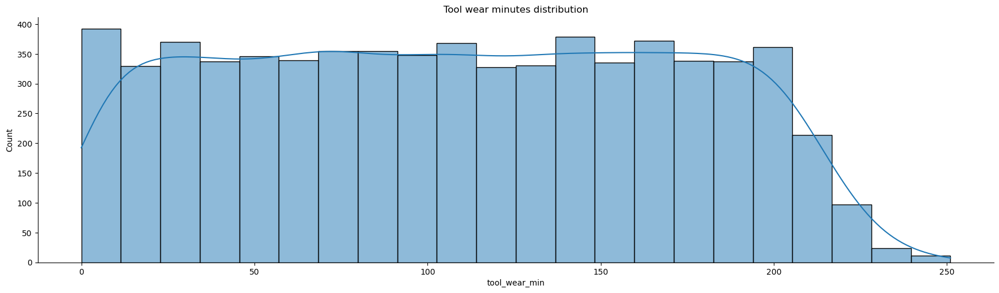

In [557]:
sns.displot(data=df, x='tool_wear_min',height = 5, aspect = 3.5, kde= True)
plt.title('Tool wear minutes distribution')
plt.show()

#### torque

In [558]:
df['torque_nm'].describe()

count   6667.00
mean      40.06
std        9.95
min        3.80
25%       33.20
50%       40.20
75%       46.80
max       76.60
Name: torque_nm, dtype: float64

Descrição estatística da variável torque_nm

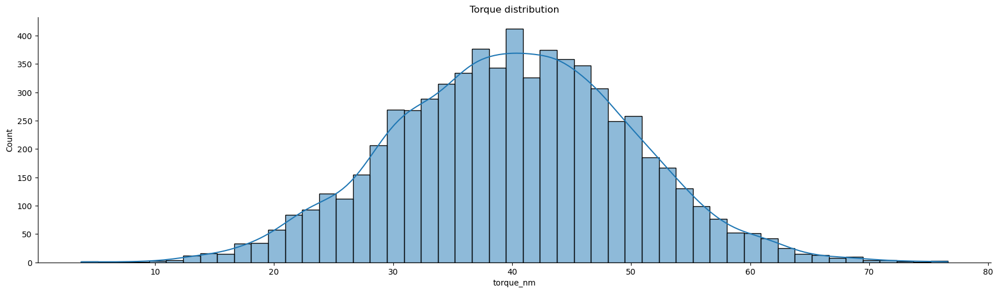

In [559]:
sns.displot(data=df, x='torque_nm',height = 5, aspect = 3.5, kde= True)
plt.title('Torque distribution')
plt.show()

A varíavel torque_nm tende também a ter uma distribuição normal com a média e mediana quase coincidindo.

#### Rotational speed

In [560]:
df['rotational_speed_rpm'].describe()

count   6667.00
mean    1537.42
std      177.18
min     1168.00
25%     1422.50
50%     1503.00
75%     1612.00
max     2886.00
Name: rotational_speed_rpm, dtype: float64

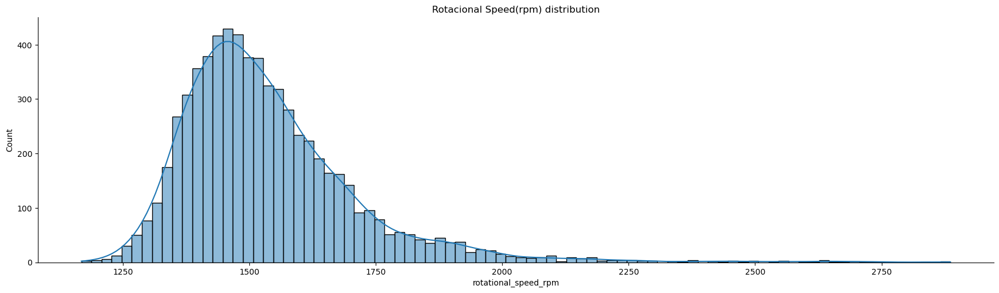

In [561]:
sns.displot(data=df, x='rotational_speed_rpm',height = 5, aspect = 3.5, kde= True)
plt.title('Rotacional Speed(rpm) distribution')
plt.show()


#### Machine type

In [562]:
#Distrui

In [563]:
df['type'].value_counts(normalize = True)*100

L   60.33
M   29.80
H    9.87
Name: type, dtype: float64

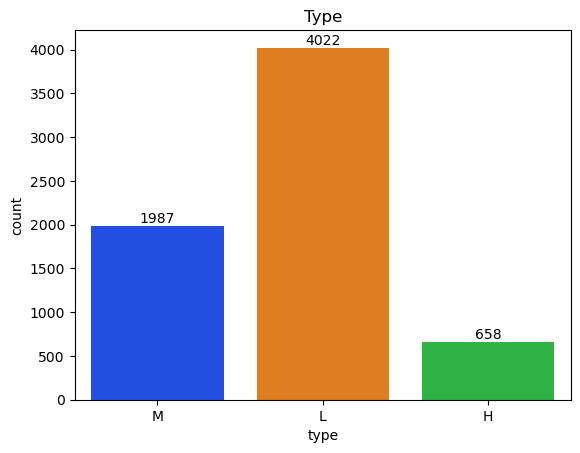

In [564]:
ax = sns.countplot(x='type', data=df, palette='bright')
ax.bar_label(ax.containers[0])
plt.title("Type")
plt.show()

Há 3 tipos diferentes de máquinas na base, sendo a maioria do tipo L

#### Failure Type

In [565]:
df['failure_type'].value_counts(normalize = True)*100

No Failure                 96.52
Heat Dissipation Failure    1.12
Power Failure               0.94
Overstrain Failure          0.78
Tool Wear Failure           0.45
Random Failures             0.18
Name: failure_type, dtype: float64

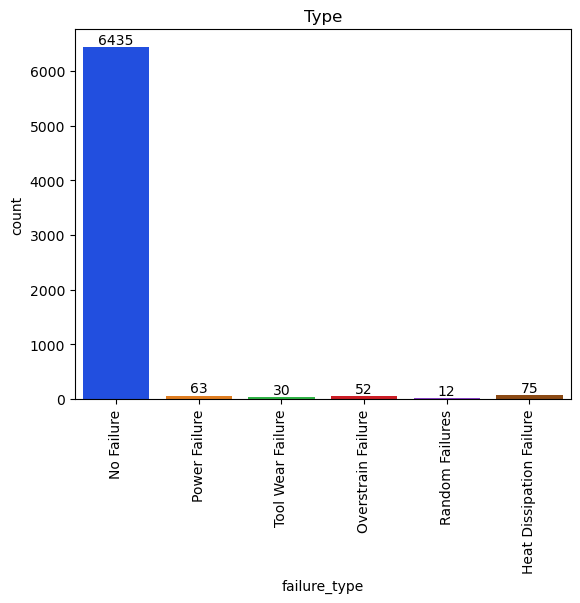

In [566]:
ax = sns.countplot(x='failure_type', data=df, palette='bright')
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title("Type")
plt.show()

Como a varíavel failure_type é o target, **esse problema de classificação é multiclasse** pois existem 5 tipos de classes a serem previstas. Quase 97% das máquinas na base não tiveram falhas, o que indicam que os dados são bastante desbalanceados

In [567]:
failures= df[df.failure_type !='No Failure'].groupby('failure_type').count()[['udi']].rename(columns={'udi':'qtd'}).reset_index()
failures

,failure_type,qtd
0,Heat Dissipation Failure,75
1,Overstrain Failure,52
2,Power Failure,63
3,Random Failures,12
4,Tool Wear Failure,30


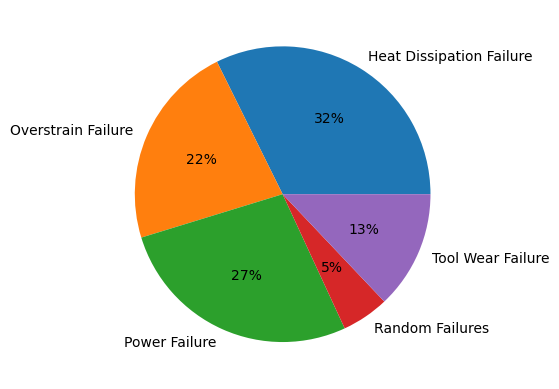

In [568]:
plt.pie(data = failures, labels = 'failure_type',x='qtd', autopct='%.0f%%')
plt.show()

Há 5 tipos de falhas, sendo a menor recorrente o tipo de falha randômico, o que é esperado.

**Criando a variavel failure que informa somente se falhou ou não independente do tipo de falha**

In [569]:
def get_failure(failure_type):
    # A função tem como parâmetro de entrada a coluna failure_type do dataframe e retorna 0 para 
    #a entrada 'No Failure' (não há falha) e 1 para qualquer outra entrada (houve falha).
    
    if failure_type == 'No Failure':
        status = 0
    else:
        status = 1
    return status
        

In [570]:
df['failure'] = df['failure_type'].apply(get_failure)

In [571]:
df['failure'].value_counts(normalize=True)*100

0   96.52
1    3.48
Name: failure, dtype: float64

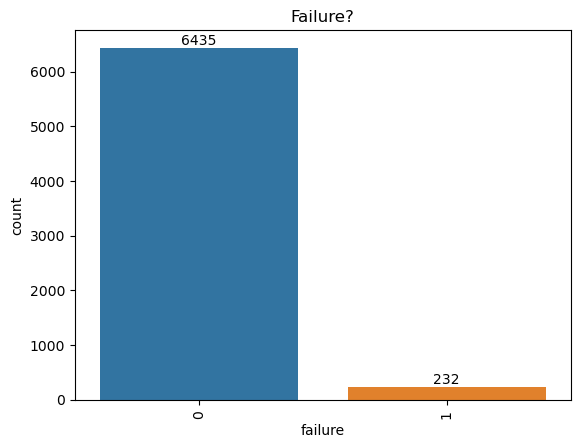

In [572]:
ax = sns.countplot(x='failure', data=df)

#sns.move_legend(ax, title='', loc='center')  # remove the title
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.title("Failure?")
plt.show()

Como visto antes a variavél a ser predita 'failure_type' é bastante desbalanceada, sendo apenas 3.48% dos dados são máquinhas com falha.

### Análise multivariada

In [573]:
df.columns

Index(['udi', 'product_id', 'type', 'air_temperature_k',
       'process_temperature_k', 'rotational_speed_rpm', 'torque_nm',
       'tool_wear_min', 'failure_type', 'failure'],
      dtype='object')

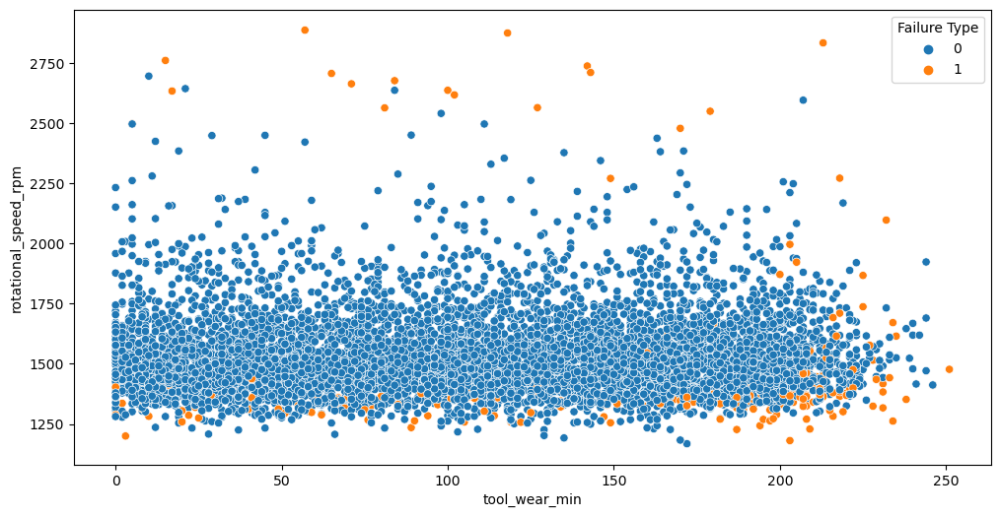

In [574]:
plt.figure(figsize=(12,6))
ax=sns.scatterplot(data=df, x='tool_wear_min', y='rotational_speed_rpm', hue='failure', palette='tab10')
ax.legend(title='Failure Type')
plt.show()




Displot para ver a distribuição de falhas para entre as variáveis 'tool_wear_min' e 'rotational_speed_rpm' que estão relacionadas
a potência da máquinas e o tempo de uso. É possivel observar falhas tantos para valores altos e baixos.

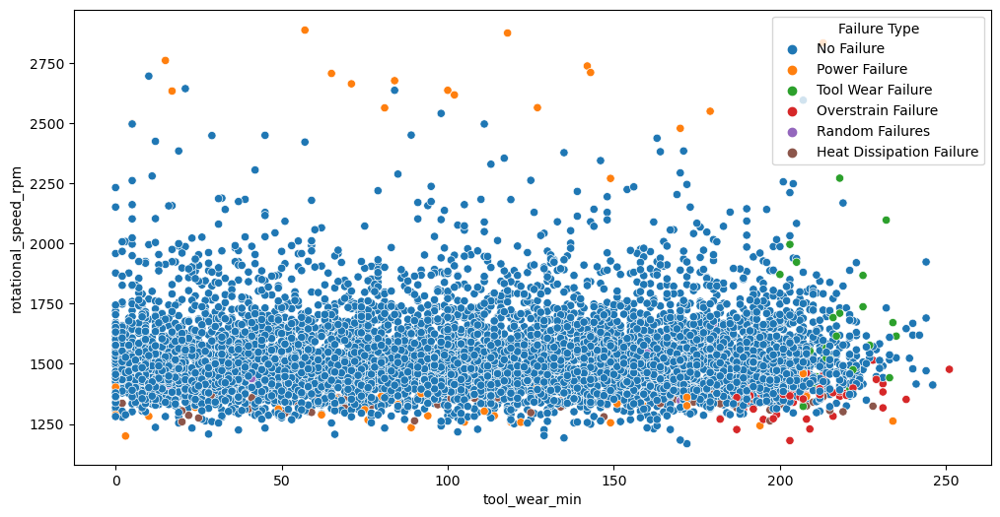

In [575]:
plt.figure(figsize=(12,6))
sns.scatterplot(data=df, x='tool_wear_min', y='rotational_speed_rpm', hue='failure_type', palette='tab10')
plt.legend(title='Failure Type')
plt.show()


Verificando o mesmo displot agora diferenciado as falhas por seu tipo. É possível notar que há falhas do tipo 'Power Failure' nos dois estremos da velocidade de rotação. Já os tipos Tool Wear Failure e  Overstrain Failure só ocorrem em altos valores de uso da máquina.

#### Investigando por cada tipo de erro

**Power Failure**

In [576]:
#Criando um dataframe com falhas do tipo Power Failure e No Failure
pwf= df[(df['failure_type']=='No Failure')|(df['failure_type']=='Power Failure')]

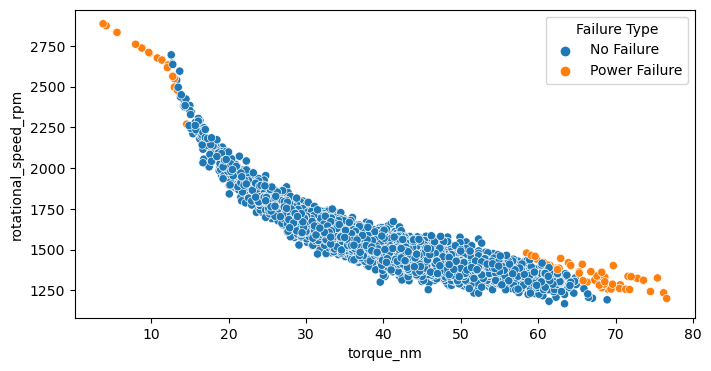

In [577]:
plt.figure(figsize=(8,4))
sns.scatterplot(data=pwf, x='torque_nm', y='rotational_speed_rpm', hue='failure_type', palette='tab10')
plt.legend(title='Failure Type')
plt.show()

O tipo Power Failure ocorre para altos torques e velocidades o que faz sentido pois está relacionado a potência da máquina 

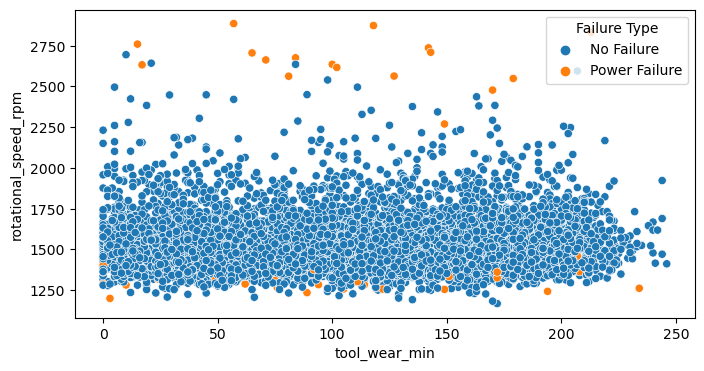

In [578]:
plt.figure(figsize=(8,4))
sns.scatterplot(data=pwf, x='tool_wear_min', y='rotational_speed_rpm', hue='failure_type', palette='tab10')
plt.legend(title='Failure Type')
plt.show()

O tipo power failure ocorre para todo o range de minutos de uso da máquina

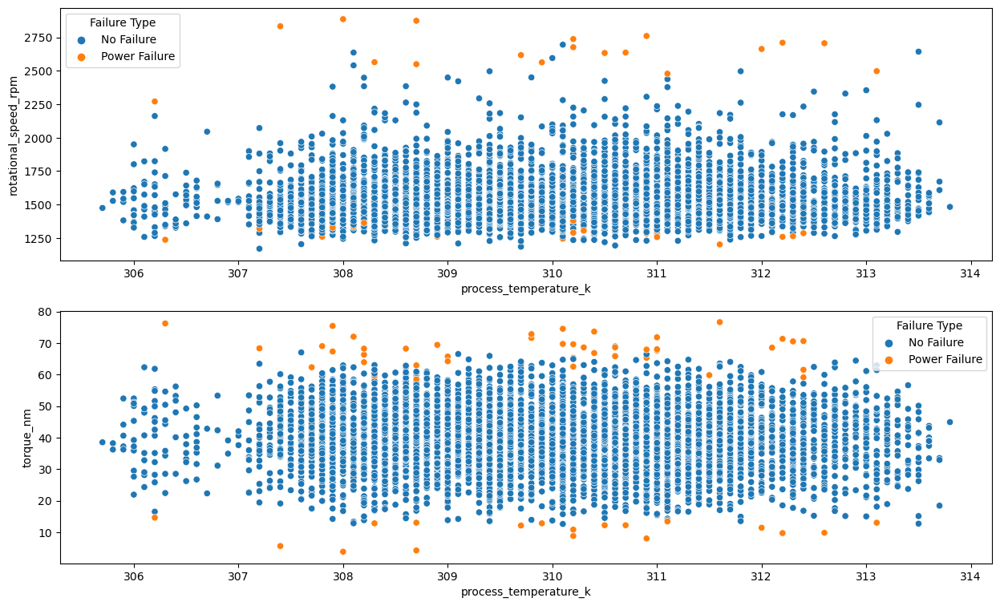

In [579]:
fig, ax =plt.subplots(2,1,figsize=(15,9))

sns.scatterplot(data=pwf, x='process_temperature_k', y='rotational_speed_rpm', hue='failure_type' ,ax=ax[0])
ax[0].legend(title='Failure Type')

sns.scatterplot(data=pwf, x='process_temperature_k', y='torque_nm', hue='failure_type',ax=ax[1])
ax[1].legend(title='Failure Type' )

plt.show()

As variáveis de temperatura parecem não impactar tanto nesse tipo de falha ocorrendo em todo o range de temperatura

**Tool Wear Failure**



In [580]:
#Criando um dataframe com falhas do tipo Tool Wear Failure e No Failure
wmf= df[(df['failure_type']=='No Failure')|(df['failure_type']=='Tool Wear Failure')]

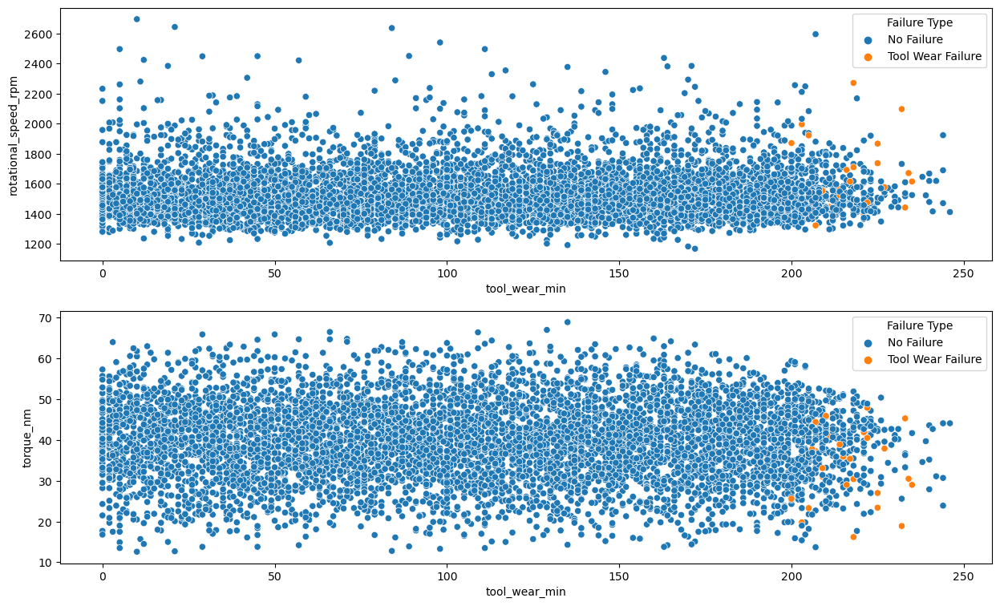

In [581]:
fig, ax =plt.subplots(2,1,figsize=(15,9))

sns.scatterplot(data=wmf, x='tool_wear_min', y='rotational_speed_rpm', hue='failure_type' ,ax=ax[0])
ax[0].legend(title='Failure Type')

sns.scatterplot(data=wmf, x='tool_wear_min', y='torque_nm', hue='failure_type',ax=ax[1])
ax[1].legend(title='Failure Type' )

plt.show()

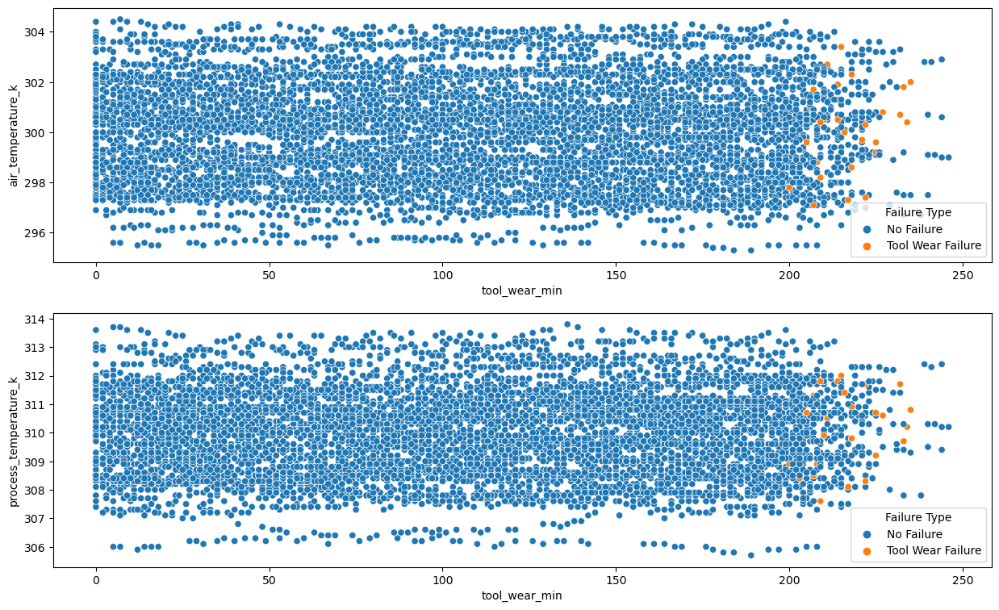

In [582]:
fig, ax =plt.subplots(2,1,figsize=(15,9))

sns.scatterplot(data=wmf, x='tool_wear_min', y='air_temperature_k', hue='failure_type' ,ax=ax[0])
ax[0].legend(title='Failure Type')

sns.scatterplot(data=wmf, x='tool_wear_min', y='process_temperature_k', hue='failure_type',ax=ax[1])
ax[1].legend(title='Failure Type' )

plt.show()

A falha do tipo Tool Wear nos maiores valores de 'tool_wear_min' independente do toque, velocidade de roatação ou temperatura de trabalho ou do ar.

**Overstrain Failure**

In [583]:
#Criando um dataframe com falhas do tipo Overstrain Failure e No Failure
osf= df[(df['failure_type']=='No Failure')|(df['failure_type']=='Overstrain Failure')]

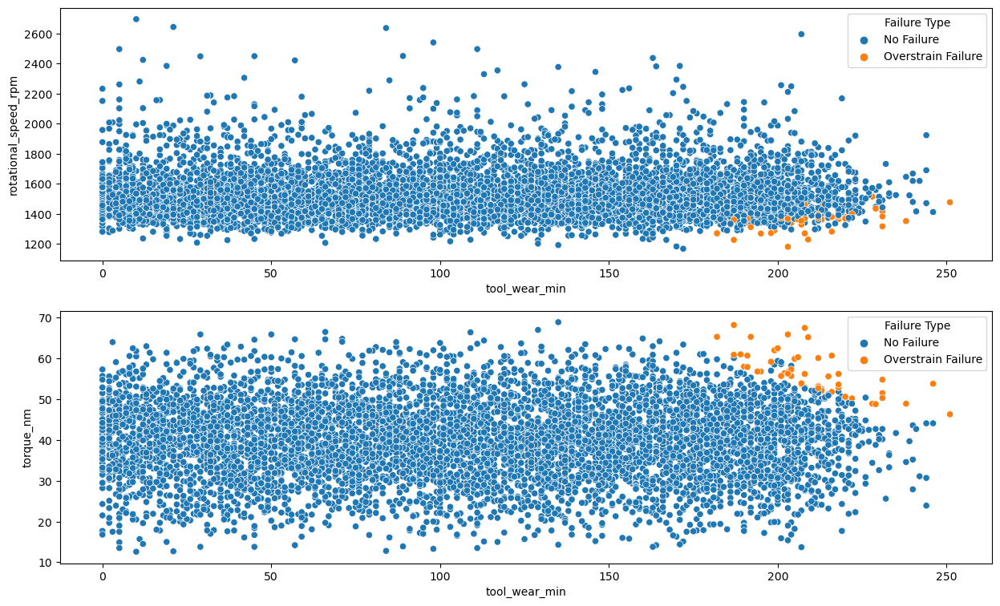

In [584]:
fig, ax =plt.subplots(2,1,figsize=(15,9))

sns.scatterplot(data=osf, x='tool_wear_min', y='rotational_speed_rpm', hue='failure_type' ,ax=ax[0])
ax[0].legend(title='Failure Type')

sns.scatterplot(data=osf, x='tool_wear_min', y='torque_nm', hue='failure_type',ax=ax[1])
ax[1].legend(title='Failure Type' )

plt.show()

A falha do tipo Overstrain ocorre para altos valores de tool_wear_min e torque

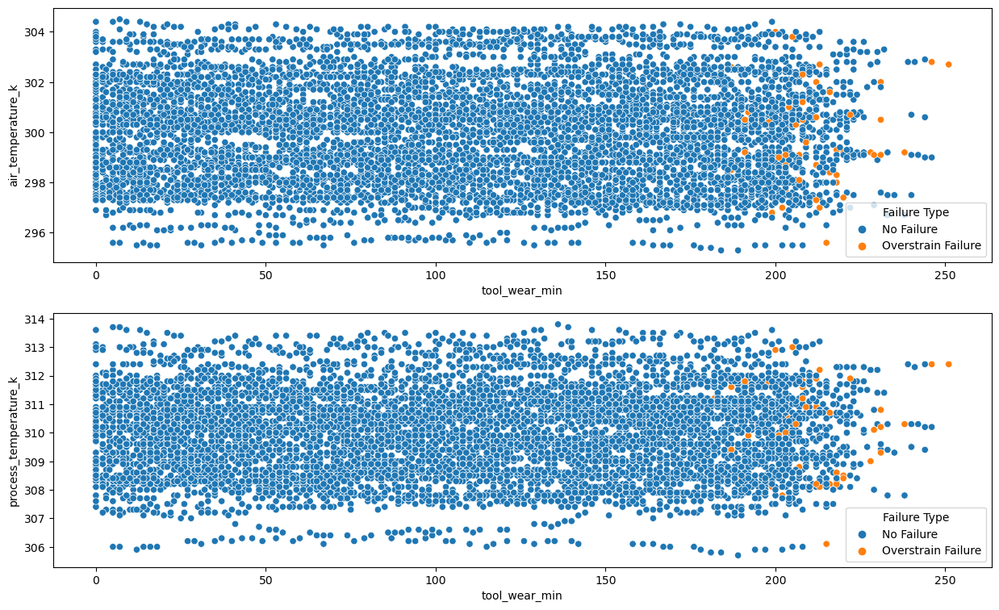

In [585]:
fig, ax =plt.subplots(2,1,figsize=(15,9))

sns.scatterplot(data=osf, x='tool_wear_min', y='air_temperature_k', hue='failure_type' ,ax=ax[0])
ax[0].legend(title='Failure Type')

sns.scatterplot(data=osf, x='tool_wear_min', y='process_temperature_k', hue='failure_type',ax=ax[1])
ax[1].legend(title='Failure Type' )

plt.show()

Temperatura não parece afetar esse tipo de falha ocorrendo em todas em todo o range de velocidades da base

**Heat Dissipation Failure**

In [586]:
#Criando um dataframe com falhas do tipo Heat Dissipation Failure e No Failure
hdf= df[(df['failure_type']=='No Failure')|(df['failure_type']=='Heat Dissipation Failure')]

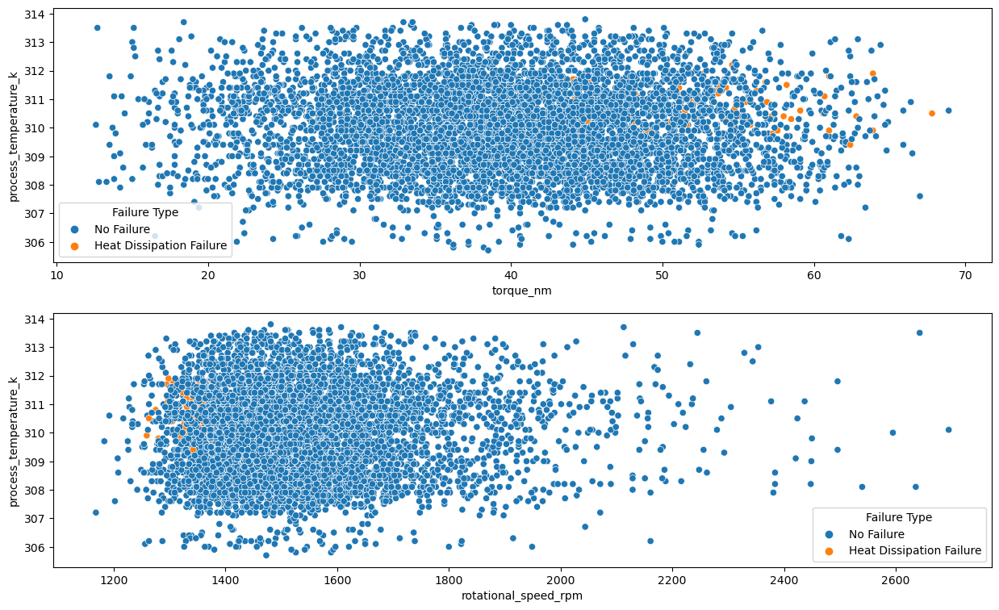

In [587]:
fig, ax =plt.subplots(2,1,figsize=(15,9))

sns.scatterplot(data=hdf, x='torque_nm', y='process_temperature_k', hue='failure_type' ,ax=ax[0])
ax[0].legend(title='Failure Type')

sns.scatterplot(data=hdf, x='rotational_speed_rpm', y='process_temperature_k', hue='failure_type',ax=ax[1])
ax[1].legend(title='Failure Type' )

plt.show()

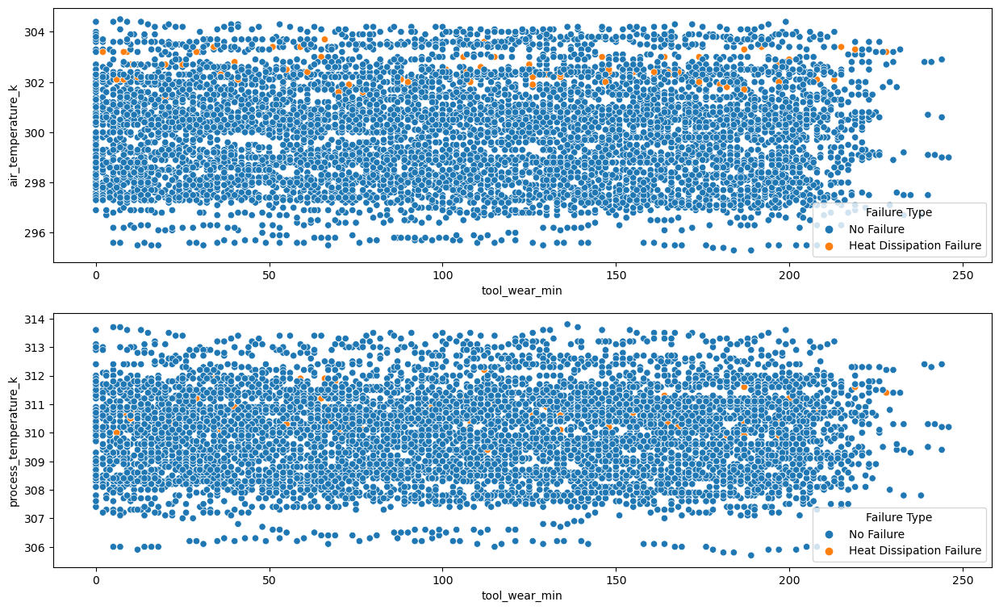

In [588]:
fig, ax =plt.subplots(2,1,figsize=(15,9))

sns.scatterplot(data=hdf, x='tool_wear_min', y='air_temperature_k', hue='failure_type' ,ax=ax[0])
ax[0].legend(title='Failure Type')

sns.scatterplot(data=hdf, x='tool_wear_min', y='process_temperature_k', hue='failure_type',ax=ax[1])
ax[1].legend(title='Failure Type' )

plt.show()

A falha do tipo Heat Dissipation Failure como esperado ocorre para altos valores de process_temperature, alto torque e baixa velocidade
de rotação, independente do tempo de uso da máquina

**Random Failure**

In [589]:
#Criando um dataframe com falhas do tipo Random Failures e No Failure
rf= df[(df['failure_type']=='No Failure')|(df['failure_type']=='Random Failures')]

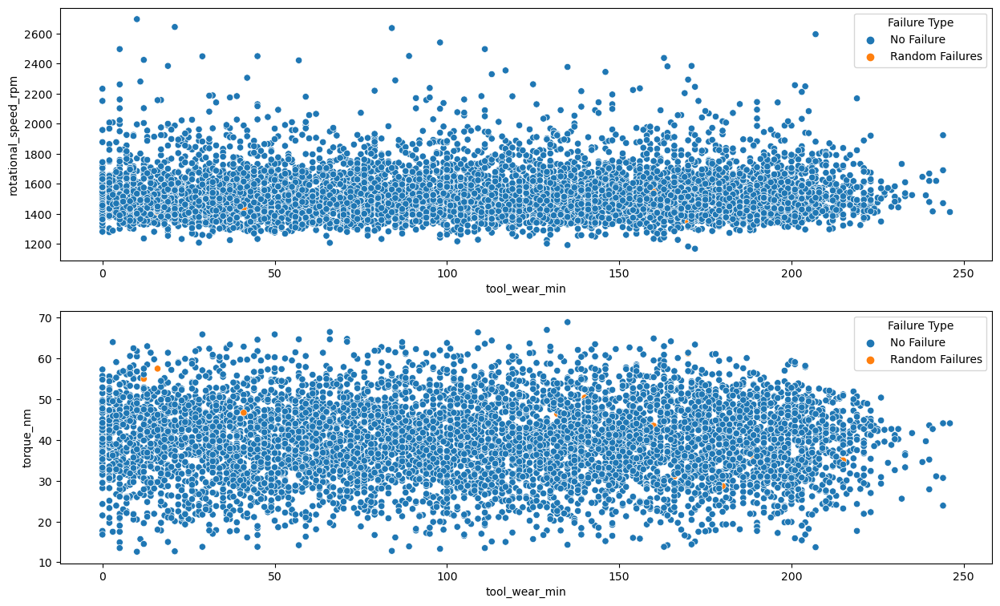

In [590]:
fig, ax =plt.subplots(2,1,figsize=(15,9))

sns.scatterplot(data=rf, x='tool_wear_min', y='rotational_speed_rpm', hue='failure_type' ,ax=ax[0])
ax[0].legend(title='Failure Type')

sns.scatterplot(data=rf, x='tool_wear_min', y='torque_nm', hue='failure_type',ax=ax[1])
ax[1].legend(title='Failure Type' )

plt.show()

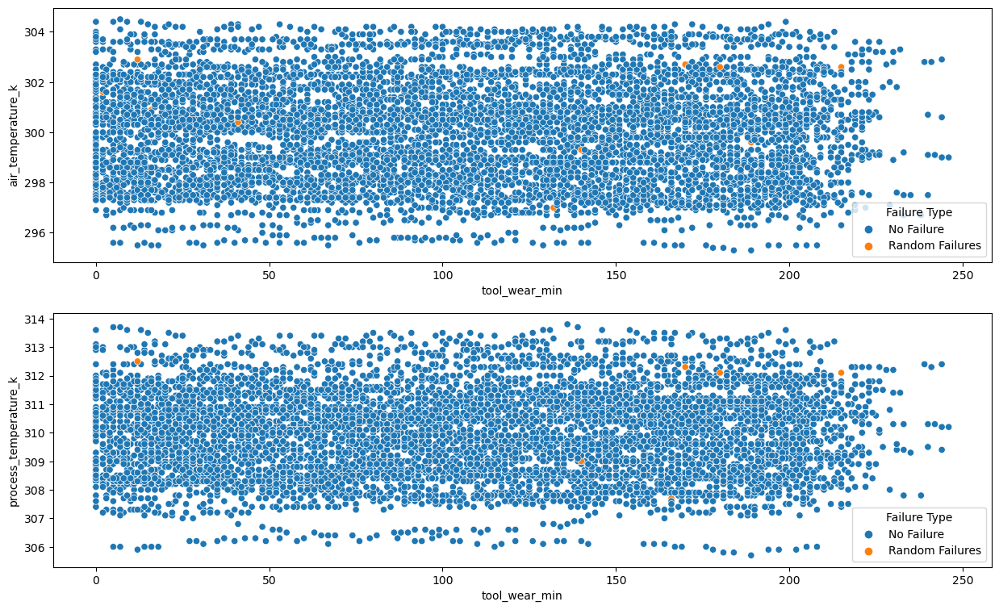

In [591]:
fig, ax =plt.subplots(2,1,figsize=(15,9))

sns.scatterplot(data=rf, x='tool_wear_min', y='air_temperature_k', hue='failure_type' ,ax=ax[0])
ax[0].legend(title='Failure Type')

sns.scatterplot(data=rf, x='tool_wear_min', y='process_temperature_k', hue='failure_type',ax=ax[1])
ax[1].legend(title='Failure Type' )

plt.show()

São apenas 12 falhas do tipo Random Failure na base, por ser randômica parece não ter tanto inflência de uma feature específica.

#### Failure by machine type

In [592]:
#Criando um dataframe com a quantidade de falhas para cada tipo de máquinha e de falha
table = pd.pivot_table(df, values='udi', index='type',columns=['failure_type'], aggfunc='count')
table.reset_index()
table.index.name = 'machine_type'
table

failure_type,Heat Dissipation Failure,No Failure,Overstrain Failure,Power Failure,Random Failures,Tool Wear Failure
machine_type,,,,,,
H,7,641,1,4,4,1
L,46,3861,50,39,7,19
M,22,1933,1,20,1,10


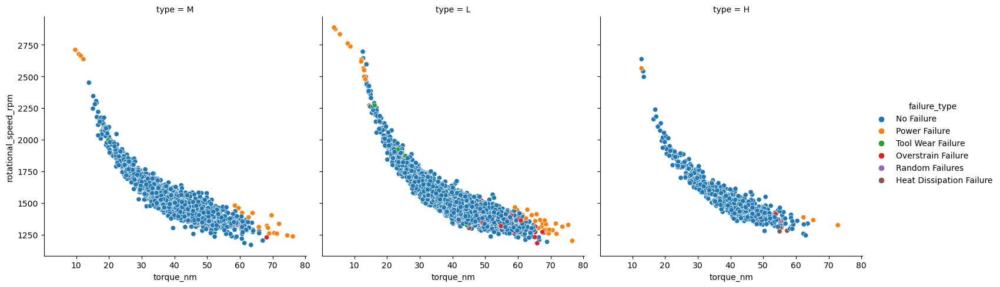

In [593]:
sns.relplot(data=df, x="torque_nm", y="rotational_speed_rpm", hue="failure_type",col="type")
plt.show()

Máquinas do tipo 'M' quase não tiveram falhas do tipo Overstrain e Random, já as máquinas do tipo 'H' quase não tiveram erros do tipo Tool Wear
e Overstrain. As máquinas do tipo 'L' teve razoavelmente falhas de todos os tipos.

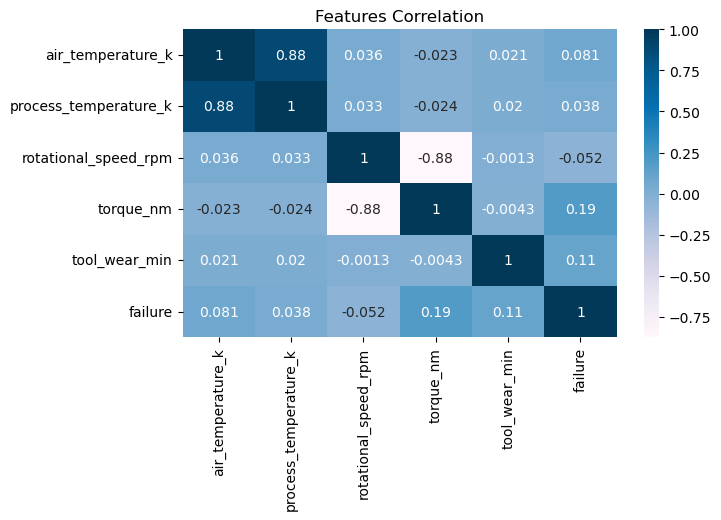

In [594]:
plt.figure(figsize=(7,4))
sns.heatmap(data=df.corr(), annot=True, cmap='PuBu')
plt.title('Features Correlation')
plt.show()

A única correlação entre as features da base de dados que se destaca é a entre torque e velocidade de rotação que é negativa e se explica devido a natureza da operação 
dos motores da máquinas.

## Preprocessing and Modeling 

**Random Failures**

In [595]:
#Criando um dataframe somente com Random Failures
rf[rf.failure==1]

,udi,product_id,type,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min,failure_type,failure
817,1222,M16081,M,297.00,308.30,1399.00,46.40,132.00,Random Failures,1
1163,1749,H31162,H,298.40,307.70,1626.00,31.10,166.00,Random Failures,1
1386,2073,L49252,L,299.60,309.50,1570.00,35.50,189.00,Random Failures,1
1710,2560,L49739,L,299.30,309.00,1447.00,50.40,140.00,Random Failures,1
2330,3453,H32866,H,301.60,310.50,1602.00,32.30,2.00,Random Failures,1
3658,5472,L52651,L,302.70,312.30,1346.00,61.20,170.00,Random Failures,1
3670,5490,L52669,L,302.60,312.10,1499.00,35.00,215.00,Random Failures,1
3674,5496,H34909,H,302.90,312.50,1357.00,55.00,12.00,Random Failures,1
3766,5640,L52819,L,302.60,312.10,1668.00,28.70,180.00,Random Failures,1
4055,6092,L53271,L,300.90,310.70,1412.00,57.50,16.00,Random Failures,1


In [596]:
print('Random failures percentage in data: {}%'.format(round(100*rf[rf.failure==1].shape[0]/df.shape[0],2)))

Random failures percentage in data: 0.18%


A quantidade de falhas deste tipo é baixíssimo, menos de 0.5% da base

In [597]:
df = df[df.failure_type!='Random Failures']

In [598]:
df =df.drop(columns=['udi','product_id'] , axis=1)

Devido a sua natureza randômica e imprevísivel a presença na base pode atrapalhar o modelo na hora de fitar o que é uma falha, devido 
a isso e baixa quantidade de dados vai ser removida da modelagem.

**Balanceamento de dados**

In [599]:
df['failure'].value_counts(normalize=True) * 100

0   96.69
1    3.31
Name: failure, dtype: float64

Ao trabalhar com dados desbalanceados em problemas de aprendizado de máquina pode ser um grande problema, porque pode confundir não só o treinamento dos modelos mas também interpretar seus resultados. Por exemplo, se um modelo para esse base de dados chutar que todas as máquinas não falham ele já vai terter 97% de precisão. Para evitar lidar com esses problemas,  é preciso balancear as classes da variável target, ou diminuindo a quantidade de uma classe ou aumentando de outra, com o objetivo de obter uma razão mais balanceada observações de funcionamento e de falhas e de preferência na mesma porcentagem de ocorrência entre os tipos de falhas. Só remover dados da classe sem falhas é muito simplista sem falhar na perda de informação para treinar o modelo. A solução que escolhi foi o uso do método SMOTE, que forma simples, gera novas amostras muito próximas da classe com menos dados na base, mas sem ser uma cópia exata.

 

In [600]:
#Balanceando as classes com método SMOTE de modo que obtenha a razão 80/20 entre não-falha e falha e com mesma quantidade de
#todos os tipos de falhas .
no_failure= df['failure_type'].value_counts()['No Failure']
new_length = round(no_failure /0.8)
n_class = round((new_length-no_failure)/4)

balanceamento = {
                 'No Failure':no_failure,
                 'Overstrain Failure':n_class,
                 'Heat Dissipation Failure':n_class,
                 'Power Failure':n_class,
                 'Tool Wear Failure':n_class}
sm = SMOTENC(categorical_features=[0,6], sampling_strategy=balanceamento, random_state=0)
df_res, y_res = sm.fit_resample(df, df['failure_type'])

In [601]:
df_res['failure_type'].value_counts(normalize=True) * 100

No Failure                 80.01
Power Failure               5.00
Tool Wear Failure           5.00
Overstrain Failure          5.00
Heat Dissipation Failure    5.00
Name: failure_type, dtype: float64

In [602]:
df_res.shape

(8043, 8)

Agora o dataframe possui 1377 entradas novas

#### Encoding

In [603]:
type_dict = {'L': 0, 'M': 1, 'H': 2}
failure_dict = {'No Failure': 0,
              'Power Failure': 1,
              'Overstrain Failure': 2,
              'Heat Dissipation Failure': 3,
              'Tool Wear Failure': 4}

In [604]:
df_res['type']=df_res['type'].map(type_dict)
df_res['failure_type']=df_res['failure_type'].map(failure_dict)
y_res= y_res.map(failure_dict)


Transformando as variáveis categóricas type e failure_type em ordinal para melhor entendimento do modelo

In [605]:
df_res

,type,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min,failure_type,failure
0,1,298.10,308.60,1551.00,42.80,0.00,0,0
1,0,298.20,308.70,1408.00,46.30,3.00,0,0
2,0,298.20,308.70,1408.00,40.00,9.00,0,0
3,1,298.10,308.60,1425.00,41.90,11.00,0,0
4,0,298.10,308.60,1558.00,42.40,14.00,0,0
...,...,...,...,...,...,...,...,...
8038,0,299.80,309.37,1398.75,42.40,219.64,4,1
8039,1,299.99,309.53,1399.86,42.54,218.99,4,1
8040,0,301.76,310.56,1529.39,36.54,210.20,4,1
8041,0,301.09,311.61,1544.23,34.70,208.24,4,1


In [606]:
#Definindo o conjunto de dados de treino e de teste
X = df_res.drop(columns=['failure_type','failure'] , axis=1)
y = y_res
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=0)

In [607]:
#Fitando vários modelos de classificação com o LazyClassifier para encontrar os melhores modelos.
clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)
models.sort_values(by='Accuracy',ascending=False)

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [00:08<00:00,  3.46it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
XGBClassifier,0.98,0.98,None,0.98,0.58
LGBMClassifier,0.98,0.97,None,0.98,0.47
RandomForestClassifier,0.98,0.98,None,0.98,0.78
ExtraTreesClassifier,0.98,0.95,None,0.98,0.36
BaggingClassifier,0.98,0.96,None,0.98,0.14
DecisionTreeClassifier,0.97,0.97,None,0.98,0.03
LabelPropagation,0.97,0.96,None,0.97,1.23
LabelSpreading,0.97,0.96,None,0.97,1.95
SVC,0.96,0.92,None,0.96,0.80


In [608]:
print('Os modelos com melhores scores são:',list(models.index[1:5]))

Os modelos com melhores scores são: ['XGBClassifier', 'LGBMClassifier', 'DecisionTreeClassifier', 'BaggingClassifier']


### Tunagem dos Hyperâmetros

Após encontrar os modelos, com objetivo de melhorar a performance e os resultados pode ser feito uma escolha dos melhores
parâmetros. Para esse "tunagem" desses parâmetros utilizei o Grid Search que tenta calcular vários parâmetros dentro de um range(grid)
estabelecido.

In [609]:
def tune_and_fit(clf,X,y,params,task):
#Essa função tem como entrada uma lista de modelos, o dados para treinamento X, a varíavel target y, uma lista de parâmetros
# e um o tipo da tarefa que no caso é uma classificação multiclasse. A 
    if task=='multi_class':
        f2_scorer = make_scorer(fbeta_score, beta=2, average='weighted')
        start_time = time.time()
        grid_model = GridSearchCV(clf, param_grid=params,
                              cv=5, scoring=f2_scorer)
        grid_model.fit(X, y)
        
    print('Best params:', grid_model.best_params_)
    # Print training times
    train_time = time.time()-start_time
    mins = int(train_time//60)
    print('Training time: '+str(mins)+'m '+str(round(train_time-mins*60))+'s') 
    return grid_model

In [610]:
# Modelos
xgb = XGBClassifier()
lgbm =lgb.LGBMClassifier()
rfc = RandomForestClassifier()
etc= ExtraTreesClassifier()

clf = [xgb,lgbm,rfc,etc]
clf_str = ['XGB','LGBM','RFC','ETC']

#Parâmetros
xgb_params = {'n_estimators':[100,300,500],
              'max_depth':[5,7,10],
              'learning_rate':[0.01,0.1],
              'objective':['multi:softprob']}
lgbm_params = {'n_estimators':[100,300,500],
              'max_depth':[5,7,10],
              'learning_rate':[0.01,0.1],
              'objective':['multiclass']}

rfc_params = {'n_estimators':[100,300,500,700],
              'max_depth':[5,7,10],
              'random_state':[0]}
etc_params = {'n_estimators':[100,300,500,700],
              'max_depth':[5,7,10],
              'random_state':[0]}
params = pd.Series(data=[xgb_params,lgbm_params,rfc_params,etc_params],
                    index=clf)


# Tunando os hyperparametros com GridSearch
print('GridSearch start...')
fitted_models_multi = []
for model, model_name in zip(clf, clf_str):
    print('Training '+str(model_name))
    fit_model = tune_and_fit(model,X_train,y_train,params[model],'multi_class')
    fitted_models_multi.append(fit_model)

GridSearch start...
Training XGB
Best params: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500, 'objective': 'multi:softprob'}
Training time: 2m 29s
Training LGBM
Best params: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 500, 'objective': 'multiclass'}
Training time: 0m 49s
Training RFC
Best params: {'max_depth': 10, 'n_estimators': 300, 'random_state': 0}
Training time: 1m 4s
Training ETC
Best params: {'max_depth': 10, 'n_estimators': 300, 'random_state': 0}
Training time: 0m 31s


**Treinando os modelos novamente agora com o melhores com os hyperâmetros otimizados**

In [611]:
xgbc = XGBClassifier(learning_rate=0.1, max_depth= 5, n_estimators= 500, objective= 'multi:softprob')

#start_time = time.time()
xgbc.fit(X_train, y_train)
#train_time_xgbc = time.time()-start_time
#print('Training time: ',str(round(train_time_xgbc,2))+' s') 
print("score on test: " + str(xgbc.score(X_test, y_test)))
print("score on train: "+ str(xgbc.score(X_train, y_train)))


 

score on test: 0.9838375466224617
score on train: 1.0


In [612]:
lgbm = lgb.LGBMClassifier(learning_rate= 0.1, max_depth=10, n_estimators=300, objective='multiclass')
#start_time = time.time()
lgbm.fit(X_train, y_train)
#train_time_lgbm = time.time()-start_time
#print('Training time: ',str(round(train_time_lgbm,2))+' s') 
print("score on test: " + str(lgbm.score(X_test, y_test)))
print("score on train: "+ str(lgbm.score(X_train, y_train)))


score on test: 0.984251968503937
score on train: 1.0


In [613]:
rf = RandomForestClassifier(n_estimators=300, max_depth=10,random_state= 0)
#start_time = time.time()
rf.fit(X_train, y_train)
#train_time_rf = time.time()-start_time
#print('Training time: ',str(round(train_time_rf,2))+' s') 
    
print("score on test: " + str(rf.score(X_test, y_test)))
print("score on train: "+ str(rf.score(X_train, y_train)))


score on test: 0.9743058433485288
score on train: 0.9953818827708704


In [614]:
etc = ExtraTreesClassifier(max_depth=10, n_estimators= 300, random_state=0, )
#start_time = time.time()
etc.fit(X_train, y_train)
#train_time_etc = time.time()-start_time
#print('Training time: ',str(round(train_time_etc,2))+' s') 
print("score on test: " + str(etc.score(X_test, y_test)))
print("score on train: "+ str(etc.score(X_train, y_train)))

score on test: 0.9212598425196851
score on train: 0.9369449378330373


In [615]:
models = [xgbc,lgbm,rf,etc]

In [616]:
classifiers = [xgbc,lgbm,rf,etc]
for cls in classifiers:
    cls.fit(X_train, y_train)

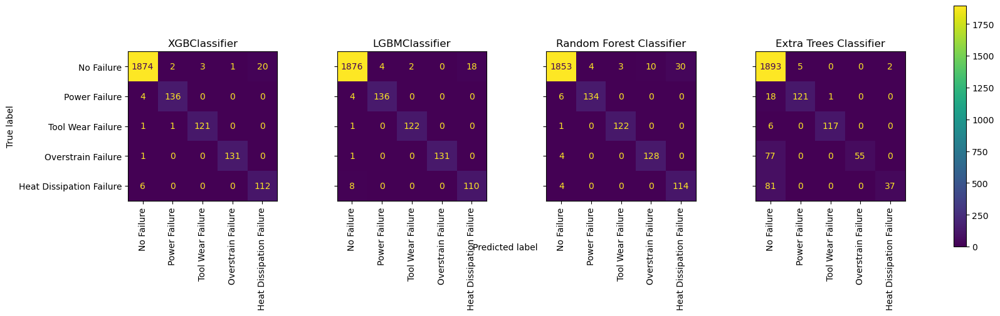

,nome,F1 score,accuracy,auc,time
1,LGBMClassifier,0.98,0.98,1.00,0.94
0,XGBClassifier,0.98,0.98,1.00,2.19
2,Random Forest Classifier,0.97,0.97,1.00,1.33
3,Extra Trees Classifier,0.91,0.92,0.99,0.66


In [633]:
classifiers = {
    "XGBClassifier": xgbc,
    "LGBMClassifier": lgbm,
    "Random Forest Classifier": rf,
    "Extra Trees Classifier": etc,
    
}


f, axes = plt.subplots(1, 4, figsize=(20, 5), sharey='row')
resultados=[]
for i, (key, classifier) in enumerate(classifiers.items()):
    start_time = time.time()
    y_pred = classifier.fit(X_train, y_train).predict(X_test)
    train_time = time.time()-start_time
    cf_matrix = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(cf_matrix,
                                  display_labels=df.failure_type.unique())
    disp.plot(ax=axes[i], xticks_rotation=90)
    disp.ax_.set_title(key)
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel('')
    acc =accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    pred_prob = classifier.predict_proba(X_test)
    auc = roc_auc_score(y_test, pred_prob,multi_class='ovr', average='weighted')
    time_taken = str(round(train_time,2))
    resultados.append({'nome': key,
                       'accuracy': acc,
                       'F1 score': f1,
                       'auc':auc,
                       'time':time_taken
                       })
    
    if i!=0:
        disp.ax_.set_ylabel('')
f.text(0.4, 0.1, 'Predicted label', ha='left')
plt.subplots_adjust(wspace=0.4, hspace=0.1)


f.colorbar(disp.im_, ax=axes)
plt.show()



models = pd.DataFrame(resultados)
models[['nome','F1 score','accuracy','auc','time']].sort_values(by='accuracy', ascending=False)






Comparando os resultados obtidos, vemos que o Extra Trees Classifier é o modelo que tem o melhor desempenho mas a sua precisão é a menor, dependendo da situação poderia ser usado para obter uma resposta mais rápida. 
Os outros 3 modelos se comportam melhor e tem valores mais altos para as métricas escolhidas, tanto para treino quanto para para teste. Os desempenhos do XGBC Classifier e do LGBM Classifier são muito semelhantes entre si mas o LGBM tem um desempenho melhor. Sendo assim **o melhor modelo é o LGBM Classifier**. Para entender como os recursos contribuem para as previsões, vamos ver as Importâncias dos Recursos de Permutação para cada modelo.

In [619]:
lgbm = lgb.LGBMClassifier(learning_rate= 0.1, max_depth=10, n_estimators=300, objective='multiclass')
lgbm.fit(X_train, y_train)
y_pred = lgbm.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1900
           1       0.97      0.97      0.97       140
           2       0.98      0.99      0.99       123
           3       1.00      0.99      1.00       132
           4       0.86      0.93      0.89       118

    accuracy                           0.98      2413
   macro avg       0.96      0.98      0.97      2413
weighted avg       0.98      0.98      0.98      2413



In [620]:
pred_prob1 = lgbm.predict_proba(X_test)
auc_score = roc_auc_score(y_test, pred_prob1,multi_class='ovr', average='weighted')
print(auc_score )

0.9983444320831474


In [621]:
f1 = f1_score(y_test, y_pred, average='weighted')
print(f1)

0.9844519250278662


In [622]:
acc = accuracy_score(y_test, y_pred)
print(acc)

0.984251968503937


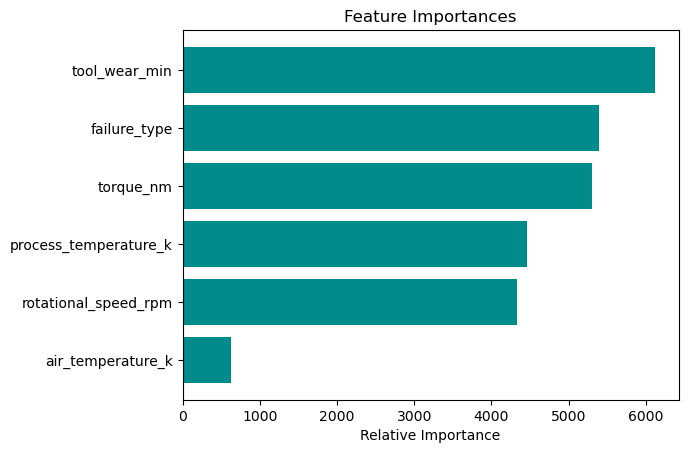

In [623]:
features = df.columns[[1,2,3,4,5,6,7]]
importances = lgbm.feature_importances_
indices = np.argsort(importances)

plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='darkcyan', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

As variáveis 'rotational_speed_rpm' e 'toruqe_nm' são as com maior contribuição para o modelo

### Subissão dos resultados 

In [624]:
X_predict = pd.read_csv('desafio_manutencao_preditiva_teste.csv')
X_predict=X_predict.drop(columns=['udi','product_id'] , axis=1)
X_predict['type']=X_predict['type'].map(type_dict)


In [625]:
# Dados para serem previstos
X_predict

,type,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min
0,0,297.50,308.60,1793,26.70,70
1,0,300.70,310.50,1536,47.40,192
2,0,297.20,308.40,1460,42.10,41
3,0,299.40,309.10,1670,35.90,68
4,0,304.10,313.10,1550,30.90,9
...,...,...,...,...,...,...
3328,0,302.50,311.90,1306,59.70,172
3329,0,300.70,311.00,1413,52.00,91
3330,0,300.80,311.20,1481,38.50,181
3331,0,302.80,312.20,1509,36.50,52


In [626]:
#Prevendo o usando o melhor modelo obtido
result_predict=lgbm.predict(X_predict)
result_predict

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [627]:
#Criando dataframe com a linha e predição
submissao = pd.DataFrame({
    
    'predictedValues': result_predict
})

In [628]:
#Dicionário para desfazer o encoding
desmap = {0:'No Failure',
              1:'Power Failure',
             2: 'Overstrain Failure' ,
             3: 'Heat Dissipation Failure',
             4:'Tool Wear Failure'}

In [629]:
#Desmapeando o encoding feito no pre processamento dos dados
submissao['predictedValues']=submissao['predictedValues'].map(desmap)

In [630]:
submissao.head()

,predictedValues
0,No Failure
1,No Failure
2,No Failure
3,No Failure
4,No Failure


In [631]:
submissao['predictedValues'].value_counts()

No Failure                  3208
Tool Wear Failure             37
Heat Dissipation Failure      36
Power Failure                 30
Overstrain Failure            22
Name: predictedValues, dtype: int64

In [632]:
#Salvando tabelo com os resultados
#submissao.to_csv('predicted.csv')